<a href="https://colab.research.google.com/github/vvaza22/gen-models-assign-1/blob/main/model_experiment_CycleGAN_GenResNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Connect to Google Drive

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

# Parameters

In [3]:
DATA_PATH = "/home/vazzu/Desktop/GAN/data"
SNAP_PATH = "/home/vazzu/Desktop/GAN"
LEARNING_RATE = 1e-5
LAMBDA_CYCLE = 5.0
LAMBDA_ID = 5.0
DROPOUT=0.3
N_RES_BLOCKS=9

# Wandb

In [4]:
# !pip install -q wandb

In [5]:
# !wandb login

# Imports

In [6]:
import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
from torch.utils.data import Dataset, DataLoader
import torchvision.models as models
import torchvision.transforms as transforms
from torchsummary import summary

In [7]:
import PIL
from PIL import Image
import matplotlib.pyplot as plt

In [8]:
import itertools
import os
import random
import shutil
import time
from tqdm.notebook import tqdm

In [9]:
import wandb

In [10]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

# Photo/Monet Dataset

In [11]:
class MonetDataset(Dataset):
  def __init__(self, monet_dir, photo_dir, transform):
    self.monet_dir = monet_dir
    self.photo_dir = photo_dir
    self.monet = [os.path.join(monet_dir, f) for f in os.listdir(monet_dir)]
    self.photo = [os.path.join(photo_dir, f) for f in os.listdir(photo_dir)]
    self.transform = transform

  def __len__(self):
    return min(len(self.monet), len(self.photo))

  def __getitem__(self, idx):
    monet = Image.open(self.monet[idx]).convert("RGB")
    photo = Image.open(random.choice(self.photo)).convert("RGB")

    monet = self.transform(monet)
    photo = self.transform(photo)

    return photo, monet

In [12]:
t = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [13]:
dataset = MonetDataset(
  f"{DATA_PATH}/monet_jpg/",
  f"{DATA_PATH}/photo_jpg/",
  transform = t
)

In [14]:
loader = DataLoader(dataset, batch_size=1, pin_memory=True)

In [15]:
def tensor_to_image(x):
    img = x[0].detach().cpu()
    img = img.permute(1, 2, 0)
    img = (img + 1) / 2
    img = torch.clamp(img, 0, 1)
    return img.numpy()

In [16]:
def show2(photo, monet):
  photo = tensor_to_image(photo)
  monet = tensor_to_image(monet)

  fig, axes = plt.subplots(1, 2, figsize=(10,5))
  axes[0].imshow(photo)
  axes[0].set_title("Photo")
  axes[0].axis('off')

  axes[1].imshow(monet)
  axes[1].set_title("Monet")
  axes[1].axis('off')

  plt.show()

def show3(photo, fake_monet, reconst_photo):
  photo = tensor_to_image(photo)
  fake_monet = tensor_to_image(fake_monet)
  reconst_photo = tensor_to_image(reconst_photo)

  fig, axes = plt.subplots(1, 3, figsize=(10,5))
  axes[0].imshow(photo)
  axes[0].set_title("Photo")
  axes[0].axis('off')

  axes[1].imshow(fake_monet)
  axes[1].set_title("Fake Monet")
  axes[1].axis('off')

  axes[2].imshow(reconst_photo)
  axes[2].set_title("Photo reconstruction")
  axes[2].axis('off')

  plt.show()

In [17]:
def tensor_to_wandb(x):
    img = x[0].detach().cpu() 
    img = (img + 1) / 2
    img = 255 * img
    img = torch.clamp(img, 0, 255)
    return wandb.Image(img)

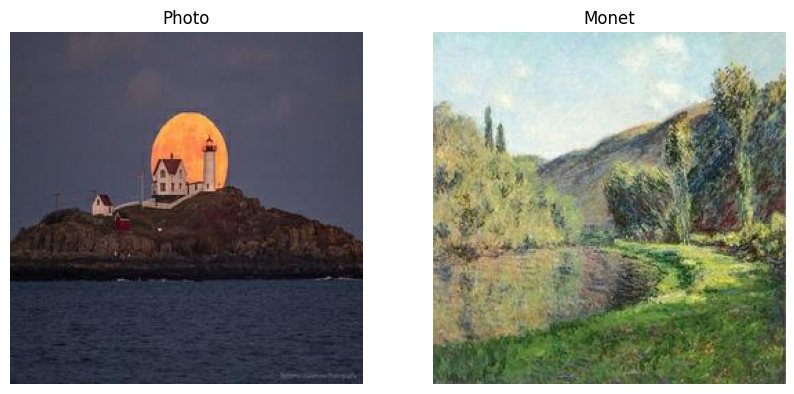

In [18]:
photo, monet = next(iter(loader))
show2(photo, monet)

# GAN Code

## Residual Neural Network Block

In [19]:
class ResNetBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.seq = nn.Sequential(
            nn.Conv2d(
                channels,
                channels,
                padding_mode="reflect",
                kernel_size=3,
                padding=1,
            ),
            nn.InstanceNorm2d(channels),
            nn.ReLU(),

            nn.Dropout(p=DROPOUT),
            
            nn.Conv2d(
                channels,
                channels,
                padding_mode="reflect",
                kernel_size=3,
                padding=1,
            ),
            nn.InstanceNorm2d(channels),
        )

    def forward(self, X):
        # Residual connection
        return X + self.seq(X)


## Generator (ResNet)

In [20]:
class Generator(nn.Module):
    def __init__(self, n_res_blocks=9):
        super().__init__()

        encoder = [
            nn.Conv2d(
                3,
                64,
                kernel_size=7,
                padding=3,
                stride=1,
                padding_mode="reflect",
            ),
            nn.InstanceNorm2d(64),
            nn.ReLU(),

            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(),

            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(),
        ]

        # ResNet blocks
        res_blocks = [ResNetBlock(256) for _ in range(n_res_blocks)]

        decoder = [
            nn.ConvTranspose2d(
                256, 128, kernel_size=3, stride=2, padding=1, output_padding=1
            ),
            nn.InstanceNorm2d(128),
            nn.ReLU(),

            nn.ConvTranspose2d(
                128, 64, kernel_size=3, stride=2, padding=1, output_padding=1
            ),
            nn.InstanceNorm2d(64),
            nn.ReLU(),

            nn.Conv2d(64, 3, kernel_size=7, padding=3, padding_mode="reflect"),
            nn.Tanh(),
        ]

        self.seq = nn.Sequential(
            *encoder,
            *res_blocks,
            *decoder
        )

    def forward(self, x):
        return self.seq(x)


## Discriminator(PatchGAN)

In [21]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()

        self.seq = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Dropout(p=DROPOUT),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Dropout(p=DROPOUT),

            nn.Conv2d(256, 512, kernel_size=4, stride=1, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2),
            nn.Dropout(p=DROPOUT),

            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1),
        )

    def forward(self, x):
        return self.seq(x)


## CycleGAN

In [22]:
def weights_init(m):
    classname = m.__class__.__name__
    # Apply to Convolutional and Linear layers
    if classname.find("Conv") != -1 or classname.find("Linear") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        if hasattr(m, "bias") and m.bias is not None:
            nn.init.constant_(m.bias.data, 0.0)

In [23]:
class CycleGAN(nn.Module):
    def __init__(
        self,
        G_photo_monet,
        G_monet_photo,
        D_photo,
        D_monet,
        lambda_cycle=10.0,
        lambda_id=5.0
    ):
        super().__init__()
        self.G_photo_monet = G_photo_monet
        self.G_monet_photo = G_monet_photo
        self.D_photo = D_photo
        self.D_monet = D_monet

        self.G_photo_monet.apply(weights_init)
        self.G_monet_photo.apply(weights_init)
        self.D_photo.apply(weights_init)
        self.D_monet.apply(weights_init)

        self.lambda_cycle = lambda_cycle
        self.lambda_id = lambda_id

        self.mae = nn.L1Loss()

        self.opt_G = optim.Adam(
            list(G_photo_monet.parameters()) + list(G_monet_photo.parameters()),
            lr=LEARNING_RATE,
            betas=(0.5, 0.999),
        )
        self.opt_D = optim.Adam(
            list(D_photo.parameters()) + list(D_monet.parameters()),
            lr=LEARNING_RATE,
            betas=(0.5, 0.999),
        )

    def train_step(self, real_photo, real_monet):
        # Switch to train mode
        self.G_photo_monet.train()
        self.G_monet_photo.train()
        self.D_photo.train()
        self.D_monet.train()

        # ======== Generators ========
        self.opt_G.zero_grad()

        fake_monet = self.G_photo_monet(real_photo)
        fake_photo = self.G_monet_photo(real_monet)

        # Hinge Adversarial loss
        loss_G_photo_monet = -self.D_monet(fake_monet).mean()
        loss_G_monet_photo = -self.D_photo(fake_photo).mean()

        # Cycle
        reconst_photo = self.G_monet_photo(fake_monet)
        reconst_monet = self.G_photo_monet(fake_photo)
        loss_cycle_photo = self.mae(reconst_photo, real_photo)
        loss_cycle_monet = self.mae(reconst_monet, real_monet)
        loss_cycle = loss_cycle_photo + loss_cycle_monet

        # Identity
        # id_photo = self.G_monet_photo(real_photo)
        # id_monet = self.G_photo_monet(real_monet)

        # loss_id_photo = self.mae(id_photo, real_photo)
        # loss_id_monet = self.mae(id_monet, real_monet)
        # loss_id = loss_id_photo + loss_id_monet

        # Total loss
        loss_G = (
            loss_G_photo_monet + loss_G_monet_photo +
            self.lambda_cycle * loss_cycle
        )
        # self.lambda_id * loss_id
        

        loss_G.backward()
        self.opt_G.step()
        # ===========================

        # ======== Discriminators ========
        self.opt_D.zero_grad()

        out_D_real_photo = self.D_photo(real_photo)
        out_D_fake_photo = self.D_photo(fake_photo.detach())
        loss_D_photo = (
            torch.relu(1.0 - out_D_real_photo).mean() +
            torch.relu(1.0 + out_D_fake_photo).mean()
        )

        out_D_real_monet = self.D_monet(real_monet)
        out_D_fake_monet = self.D_monet(fake_monet.detach())
        loss_D_monet = (
            torch.relu(1.0 - out_D_real_monet).mean() +
            torch.relu(1.0 + out_D_fake_monet).mean()
        )

        loss_D = (loss_D_photo + loss_D_monet) * 0.5

        loss_D.backward()
        self.opt_D.step()
        # ================================

        return {
            "G/loss_photo": loss_G_photo_monet.item(),
            "G/loss_monet": loss_G_monet_photo.item(),
            "G/loss_cycle": loss_cycle.item(),
            # "G/loss_id": loss_id.item(),
            "G/loss": loss_G.item(),
            "D/loss_photo": loss_D_photo.item(),
            "D/loss_monet": loss_D_monet.item(),
            "D/loss": loss_D.item(),
        }


In [24]:
def train_one_epoch(gan, loader):
    losses = None
    for photo, monet in tqdm(loader, desc="Training", unit="batch"):
        photo = photo.to(device, non_blocking=True)
        monet = monet.to(device, non_blocking=True)

        cur_losses = gan.train_step(photo, monet)

        if losses == None:
            losses = cur_losses
        else:
            for k, v in cur_losses.items():
                losses[k] += v

    for k, v in losses.items():
        losses[k] /= len(loader)

    return losses

In [25]:
def sample(gan, loader):
  photo, monet = next(iter(loader))

  real_photo = photo.to(device)

  gan.G_photo_monet.eval()
  gan.G_monet_photo.eval()

  with torch.no_grad():
    fake_monet = gan.G_photo_monet(real_photo)
    reconst_photo = gan.G_monet_photo(fake_monet)

  show3(photo, fake_monet, reconst_photo)

  return photo, fake_monet, reconst_photo

# Training

In [26]:
def save_snapshot(gan, epoch):
    name = f"{SNAP_PATH}/snapshot_epoch_{epoch}.pt"
    torch.save({
        "G_photo_monet": gan.G_photo_monet.state_dict(),
        "G_monet_photo": gan.G_monet_photo.state_dict(),
        "D_photo": gan.D_photo.state_dict(),
        "D_monet": gan.D_monet.state_dict(),
    }, name)
    return name

In [27]:
def load_snapshot(gan, path):
    ckpt = torch.load(path, map_location="cpu")
    gan.G_photo_monet.load_state_dict(ckpt["G_photo_monet"])
    gan.G_monet_photo.load_state_dict(ckpt["G_monet_photo"])
    gan.D_photo.load_state_dict(ckpt["D_photo"])
    gan.D_monet.load_state_dict(ckpt["D_monet"])

In [28]:
def train(run_name, gan, epochs, loader, params={}):
    run = wandb.init(
        entity="vvaza22-free-university-of-tbilisi",
        project="GenModels-Assignment1",
        name=run_name,
        config={
            "learning_rate": LEARNING_RATE,
            "lambda_cycle": LAMBDA_CYCLE,
            "architecture": "CycleGAN,G/ResNet,D/PatchGAN,HingeLoss",
            "optimizer": "Adam",
            "epochs": epochs,
            "dropout": DROPOUT,
            "n_res_blocks": N_RES_BLOCKS,
            **params,
        },
    )

    for epoch in range(1, epochs+1):
        print(f"===== EPOCH {epoch} =====")
        losses = train_one_epoch(gan, loader)
        real_photo, fake_monet, reconst_photo = sample(gan, loader)

        # Snapshot
        snap = save_snapshot(gan, epoch)

        # Only save the model to wandb after the final epoch
        if epoch == epochs:
            artifact = wandb.Artifact(
                name=f"model_snapshot_epoch_{epoch}",
                type="model"
            )
            artifact.add_file(snap)
            wandb.log_artifact(artifact)

        wandb.log({
            **losses,
            "real_photo": tensor_to_wandb(real_photo),
            "fake_monet": tensor_to_wandb(fake_monet),
            "reconst_photo": tensor_to_wandb(reconst_photo),
        }, step=epoch)

    run.finish()


In [29]:
gan = CycleGAN(
    G_photo_monet=Generator(n_res_blocks=N_RES_BLOCKS).to(device),
    G_monet_photo=Generator(n_res_blocks=N_RES_BLOCKS).to(device),
    D_photo=Discriminator().to(device),
    D_monet=Discriminator().to(device),
    lambda_cycle=LAMBDA_CYCLE,
    lambda_id=LAMBDA_ID
)

In [30]:
summary(gan.G_photo_monet, (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           9,472
    InstanceNorm2d-2         [-1, 64, 256, 256]               0
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4        [-1, 128, 128, 128]          73,856
    InstanceNorm2d-5        [-1, 128, 128, 128]               0
              ReLU-6        [-1, 128, 128, 128]               0
            Conv2d-7          [-1, 256, 64, 64]         295,168
    InstanceNorm2d-8          [-1, 256, 64, 64]               0
              ReLU-9          [-1, 256, 64, 64]               0
           Conv2d-10          [-1, 256, 64, 64]         590,080
   InstanceNorm2d-11          [-1, 256, 64, 64]               0
             ReLU-12          [-1, 256, 64, 64]               0
          Dropout-13          [-1, 256, 64, 64]               0
           Conv2d-14          [-1, 256,

In [31]:
summary(gan.D_photo, (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           3,136
         LeakyReLU-2         [-1, 64, 128, 128]               0
            Conv2d-3          [-1, 128, 64, 64]         131,200
    InstanceNorm2d-4          [-1, 128, 64, 64]               0
         LeakyReLU-5          [-1, 128, 64, 64]               0
           Dropout-6          [-1, 128, 64, 64]               0
            Conv2d-7          [-1, 256, 32, 32]         524,544
    InstanceNorm2d-8          [-1, 256, 32, 32]               0
         LeakyReLU-9          [-1, 256, 32, 32]               0
          Dropout-10          [-1, 256, 32, 32]               0
           Conv2d-11          [-1, 512, 31, 31]       2,097,664
   InstanceNorm2d-12          [-1, 512, 31, 31]               0
        LeakyReLU-13          [-1, 512, 31, 31]               0
          Dropout-14          [-1, 512,

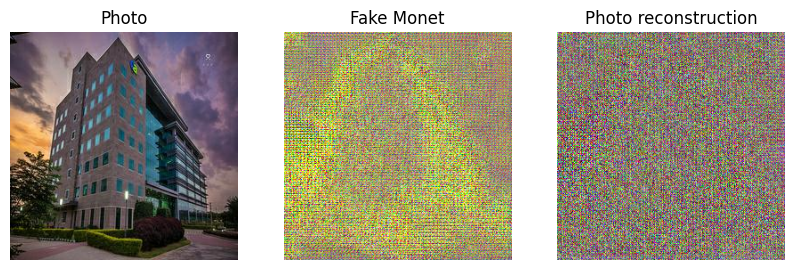

In [35]:
_, _, _ = sample(gan, loader)

wandb: Currently logged in as: vvaza22 (vvaza22-free-university-of-tbilisi) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


===== EPOCH 1 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

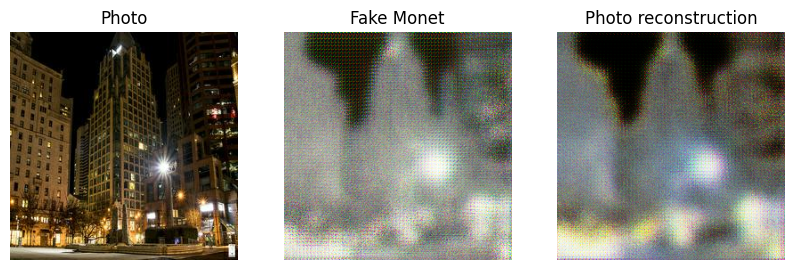

===== EPOCH 2 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

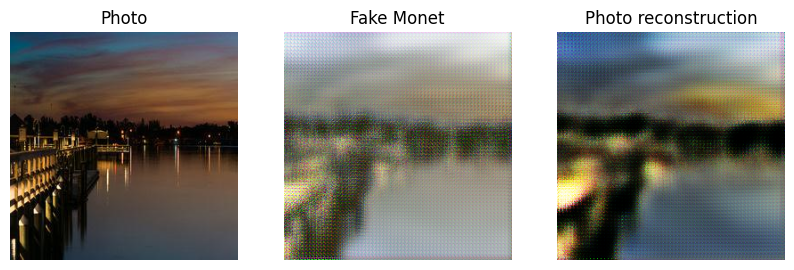

===== EPOCH 3 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

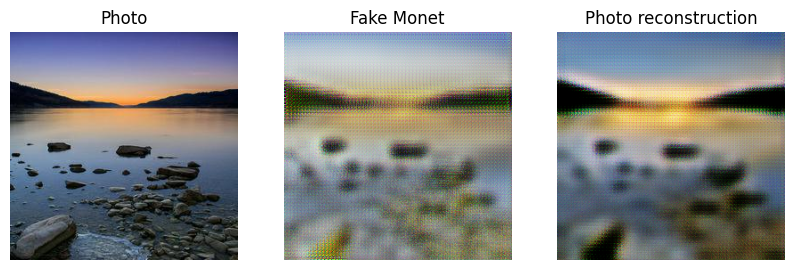

===== EPOCH 4 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

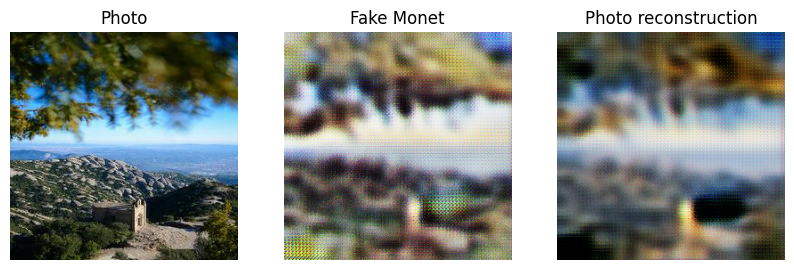

===== EPOCH 5 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

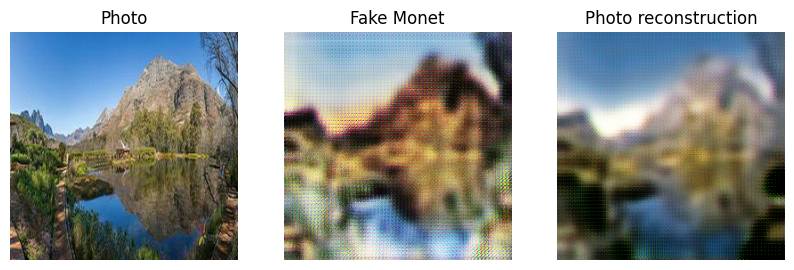

===== EPOCH 6 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

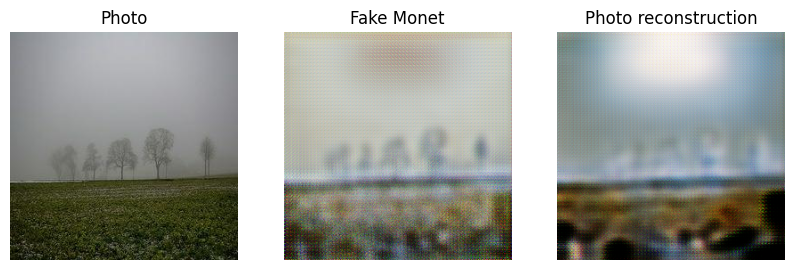

===== EPOCH 7 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

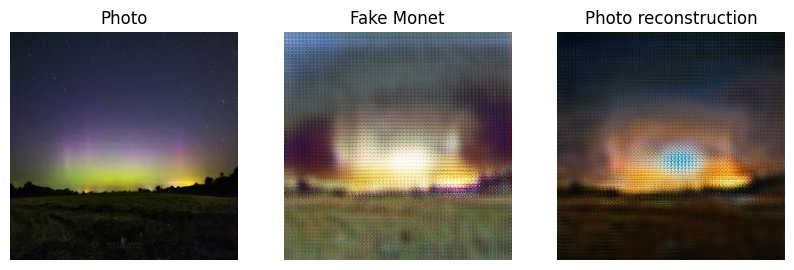

===== EPOCH 8 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

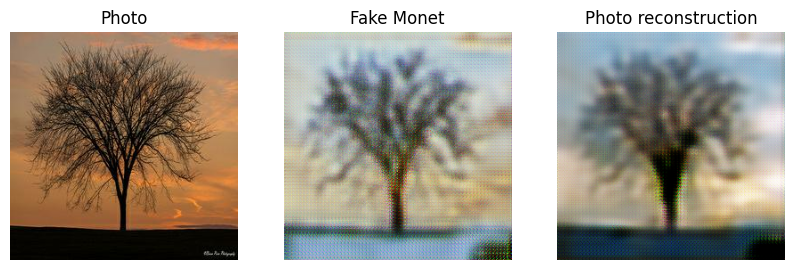

===== EPOCH 9 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

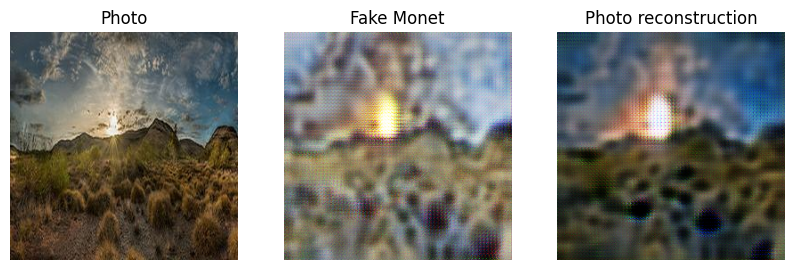

===== EPOCH 10 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

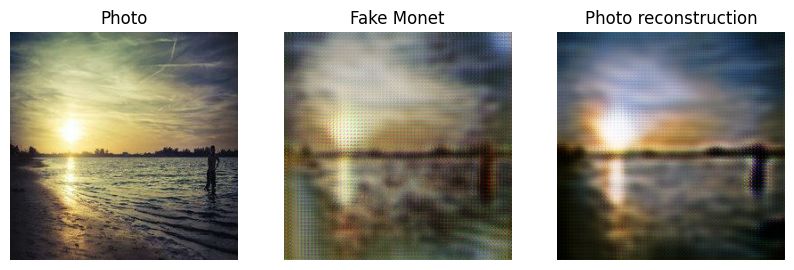

===== EPOCH 11 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

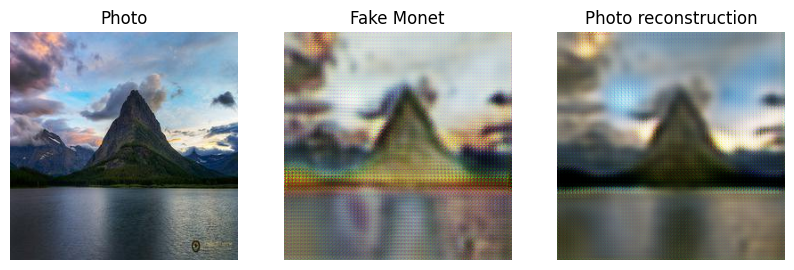

===== EPOCH 12 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

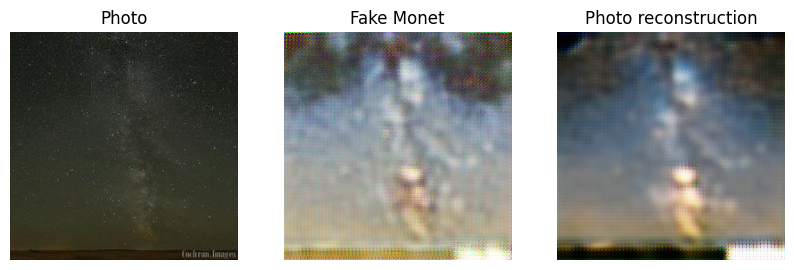

===== EPOCH 13 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

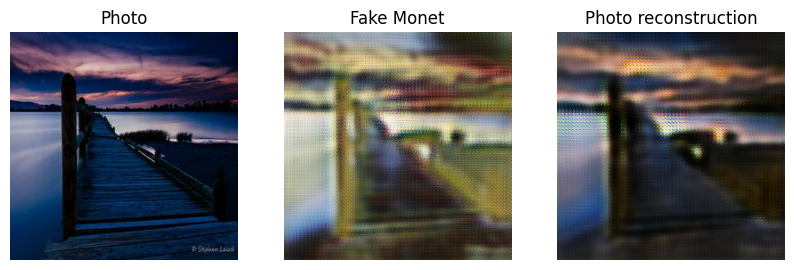

===== EPOCH 14 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

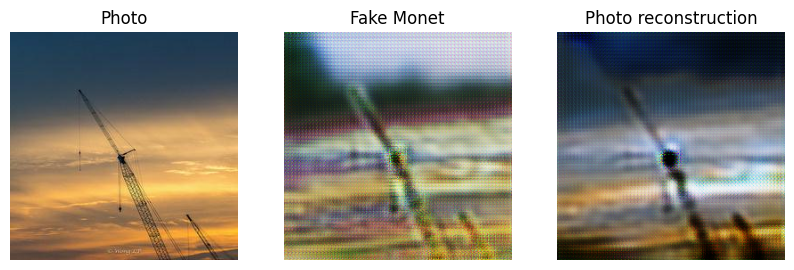

===== EPOCH 15 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

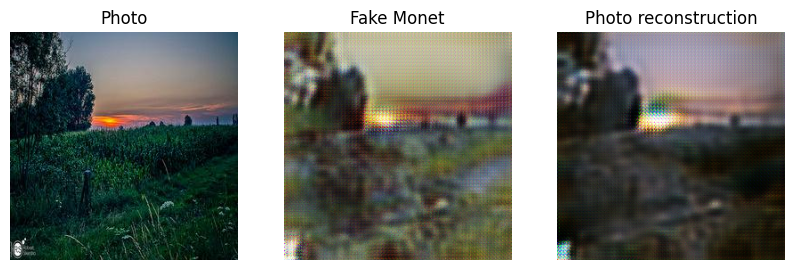

===== EPOCH 16 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

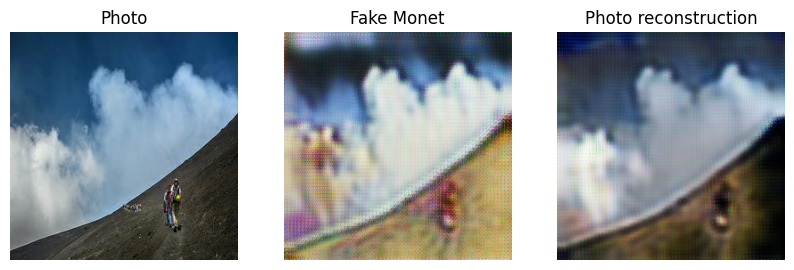

===== EPOCH 17 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

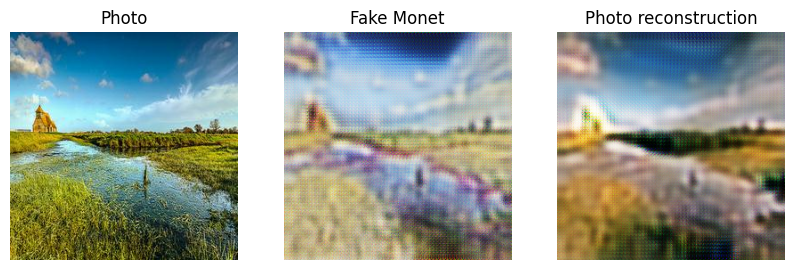

===== EPOCH 18 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

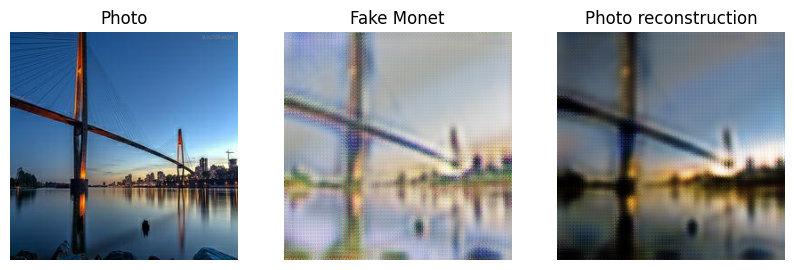

===== EPOCH 19 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

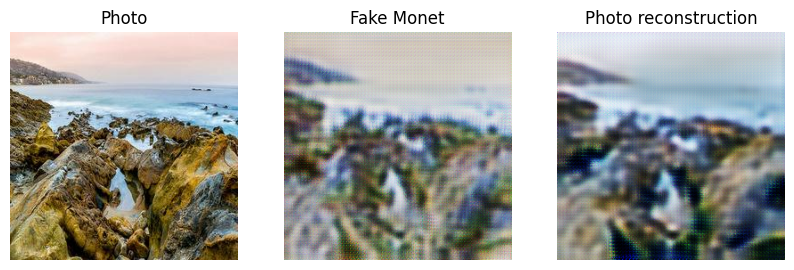

===== EPOCH 20 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

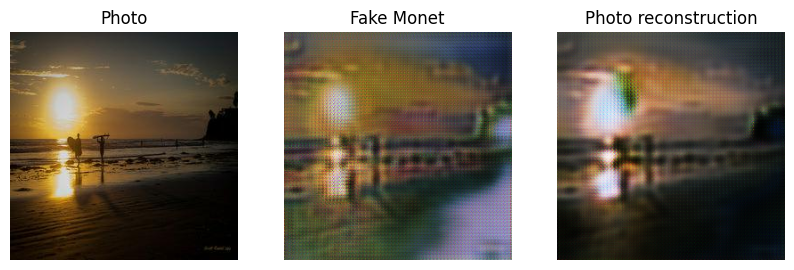

===== EPOCH 21 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

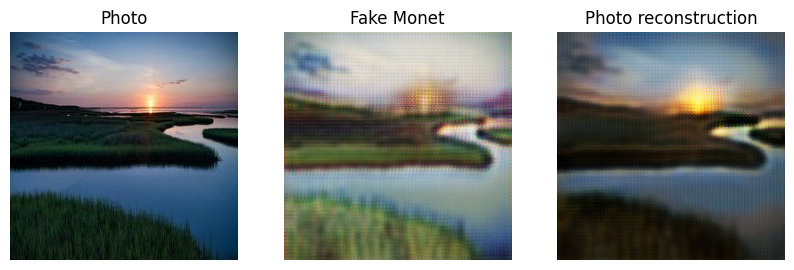

===== EPOCH 22 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

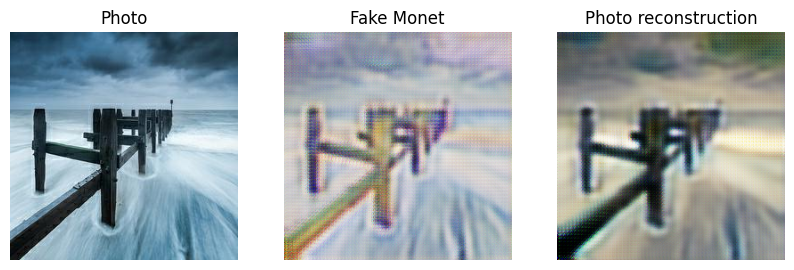

===== EPOCH 23 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

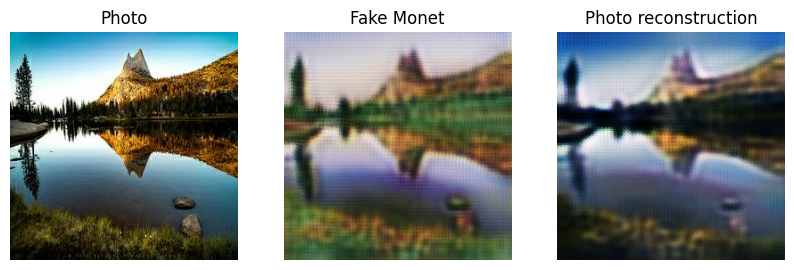

===== EPOCH 24 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

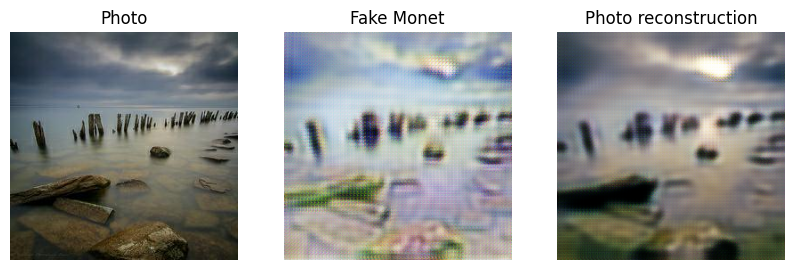

===== EPOCH 25 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

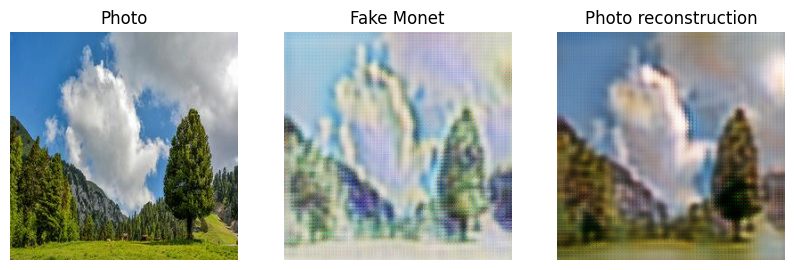

===== EPOCH 26 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

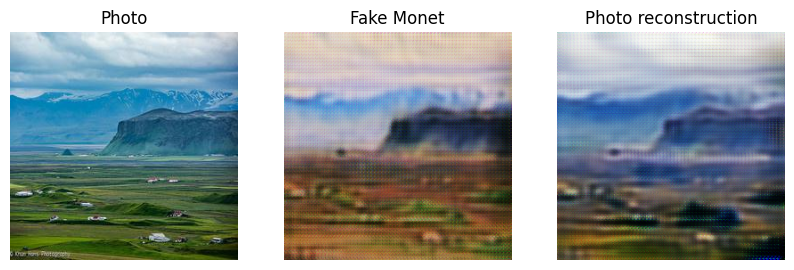

===== EPOCH 27 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

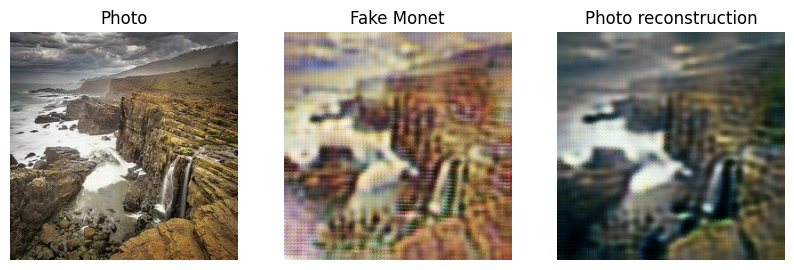

===== EPOCH 28 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

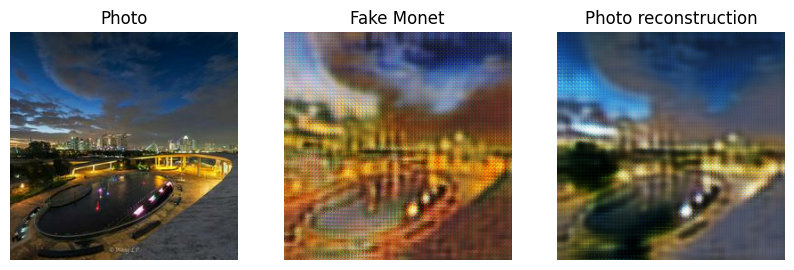

===== EPOCH 29 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

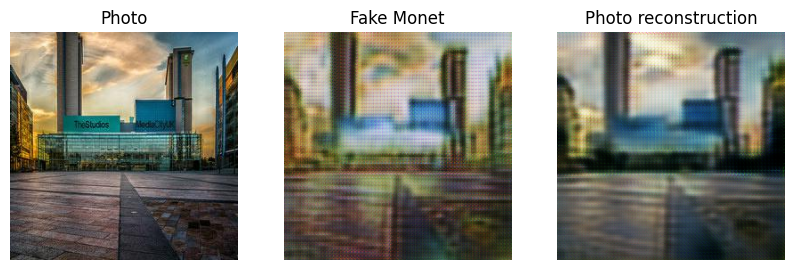

===== EPOCH 30 =====


Training:   0%|          | 0/300 [00:00<?, ?batch/s]

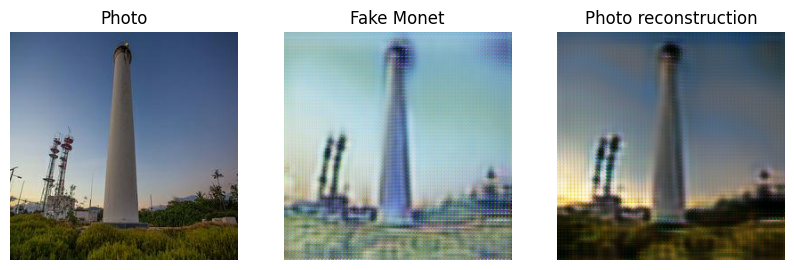

D/loss,█▆▆▅▅▅▅▅▄▅▄▄▄▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▁▁
D/loss_monet,█▆▆▅▅▅▅▅▄▅▄▄▄▄▄▄▄▄▄▄▃▃▃▃▂▂▂▂▂▁
D/loss_photo,█▆▆▅▅▅▅▅▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▁▁
G/loss,█▄▃▃▃▂▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▂▂▂
G/loss_cycle,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
G/loss_monet,▂▂▃▂▂▂▁▁▂▂▁▃▂▃▃▃▃▄▄▄▄▃▄▄▅▆▅▇██
G/loss_photo,▁▂▃▂▃▃▃▃▃▂▃▃▃▃▃▃▃▃▄▄▄▅▅▅▆▆▆▆▇█
D/loss,1.72842
D/loss_monet,1.71434
D/loss_photo,1.7425
G/loss,2.49836


In [36]:
train(
    run_name="CycleGAN_Dropout0.3_G/ResNet_D/PatchGAN_HingeLoss_nResBlocks9_LambdaCycle5_Epoch30",
    gan=gan,
    epochs=30,
    loader=loader,
)